# Who has access to LA's parks?

Since the pandemic began, a person's ability to maintain good physical and mental health has become even more dependent on their access to outdoor spaces. 

Therefore, we want to know: **How accessible are parks and other public recreation facilities in the lowest income neighborhoods and highest income neighborhoods in Los Angeles, CA?**

We will explore this question by creating charts, static maps, and interactive maps to better understand the socioeconomic landscape of Los Angeles. Let's jump in!

<img src="https://studio-mla.com/wp-content/uploads/2017/09/Studio-MLA_Vista-Hermosa-10_Hunter-Kerhart_WEB.jpg" width=600>

## Data sources
We based our research on the following data sources:

[LA city income data from the U.S. Census Bureau](https://censusreporter.org/profiles/16000US0644000-los-angeles-ca/)

[Park data from the County of Los Angeles Department of Parks and Recreation](https://data.lacity.org/Community-Economic-Development/Department-of-Recreation-and-Parks-Facility-and-Pa/ax8j-dhzm)

## Importing the libraries
The first thing we need to do is import all of the libraries that will allow us to explore our data and create our beautiful charts and maps.

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import contextily as ctx

## Analyzing LA incomes by census tract
We will create 3 charts that will help us compare the median household per income of all LA census tracts. We will do this to identify which census tracts are of interest to us for our research. The charts we will create include:

- City of Los Angeles Census Tract Income Frequency
- Top 10 Census Tracts with Lowest Incomes in the City of Los Angeles
- Top 10 Census Tracts with Highest Incomes in the City of Los Angeles

### Cleaning the data
Before we create our charts, we need to import our income data and then rename the columns so that they make more sense.

In [2]:
income1=pd.read_csv('Data1/Income_KB2.csv')
columns_to_keep = ['geoid','name','B19013001']
income1 = income1[columns_to_keep]
income1.head()

,geoid,name,B19013001
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0


In [3]:
income1.columns = ['geoid',
 'Census_Tract',
 'Median_Household_Income']
income1.head()

,geoid,Census_Tract,Median_Household_Income
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0


### Creating the charts
Now that our income data is clean, we can start to create the 3 charts! We will start by creating a chart that will allow us to see the distribution of incomes across Los Angeles.

Text(0.5, 1.0, 'City of Los Angeles Census Tract Income Frequency')

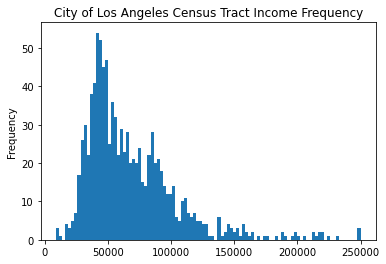

In [4]:
income1['Median_Household_Income'].plot.hist(bins=100)
plt.title('City of Los Angeles Census Tract Income Frequency')

It looks like most people make below $50,000. 

Now we want to get started on creating charts of the top 10 census tracts with the highest and lowest median household incomes. The first thing we need to do is to sort our data set by income and create variables that will store the sorted data.

In [5]:
lowest_incomes = income1.sort_values(by='Median_Household_Income',ascending = True)
highest_incomes = income1.sort_values(by='Median_Household_Income',ascending = False)
highest_incomes.head()

,geoid,Census_Tract,Median_Household_Income
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0
994,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",231250.0
833,14000US06037262501,"Census Tract 2625.01, Los Angeles, CA",224962.0


Next we can create an income bar chart of the lowest incomes.

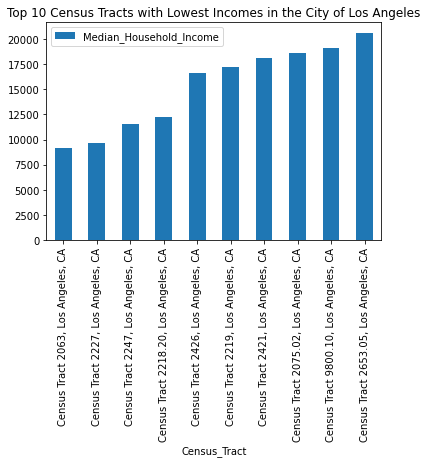

In [6]:
lowest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Lowest Incomes in the City of Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Lowest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart, we learn that the census tracts with the lowest median household incomes have incomes ranging from below 10,000 to slightly above 20,000.

Now we can make a chart for the highest incomes.

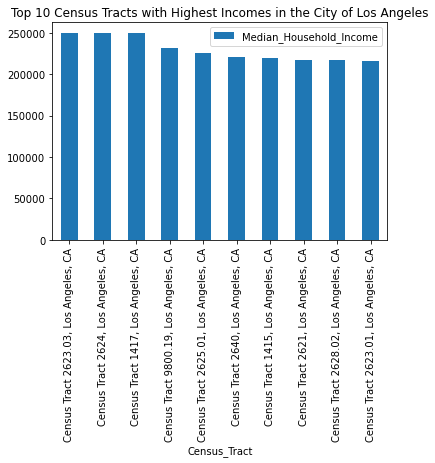

In [7]:
highest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Highest Incomes in the City of Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Highest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart we learn that the census tracts with the hgihest median household incomes have incomes around 250,000. 

## Mapping parks and income 
Perfect! Now that we have created our charts, the next thing we want to do is create interactive maps featuring park and income layers.

### Cleaning the Data
We need to do some data cleaning before we create the maps.

Looking at the bottomn of this chart we can see that there are some null values we want to get rid of.

In [8]:
income2=gpd.read_file('Data2/Income_KB.geojson')
columns_to_keep2 = ['geoid','name','B19013001','geometry']
income2 = income2[columns_to_keep2]
income2

,geoid,name,B19013001,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
...,...,...,...,...
999,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",150250.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."


Let's see how many null values there are.

In [9]:
lowest_incomes2 = income2.sort_values(by='B19013001',ascending = True)
lowest_incomes2.tail(15)

,geoid,name,B19013001,geometry
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
847,14000US06037265301,"Census Tract 2653.01, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.45549 34.07585, -118.4546..."
989,14000US06037980008,"Census Tract 9800.08, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50267 34.22121, -118.5015..."
990,14000US06037980009,"Census Tract 9800.09, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
992,14000US06037980014,"Census Tract 9800.14, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
995,14000US06037980020,"Census Tract 9800.20, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
996,14000US06037980021,"Census Tract 9800.21, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."
997,14000US06037980022,"Census Tract 9800.22, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."


Now we will get rid of the null values.

In [10]:
income2 = income2.drop([847, 989, 990, 992, 995, 996, 997, 998, 1000, 1001, 1002, 1003])

Now we can rename our columns so that they make more sense.

In [11]:
income2.columns = ['geoid',
 'Census_Tract',
 'Median_Household_Income',
 'geometry']
income2.head()

,geoid,Census_Tract,Median_Household_Income,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


### Creating the static maps

Before we begin to create our interactive map, we should first create a nice static map of median household incomes. This will allow us to really visualize where the higher income and lower income communities are in Los Angeles. Having these communities in mind will help us be more intentional when we bring in our park data!

Text(0.5, 1.0, 'Census Tracts with median household incomes less than $125,000')

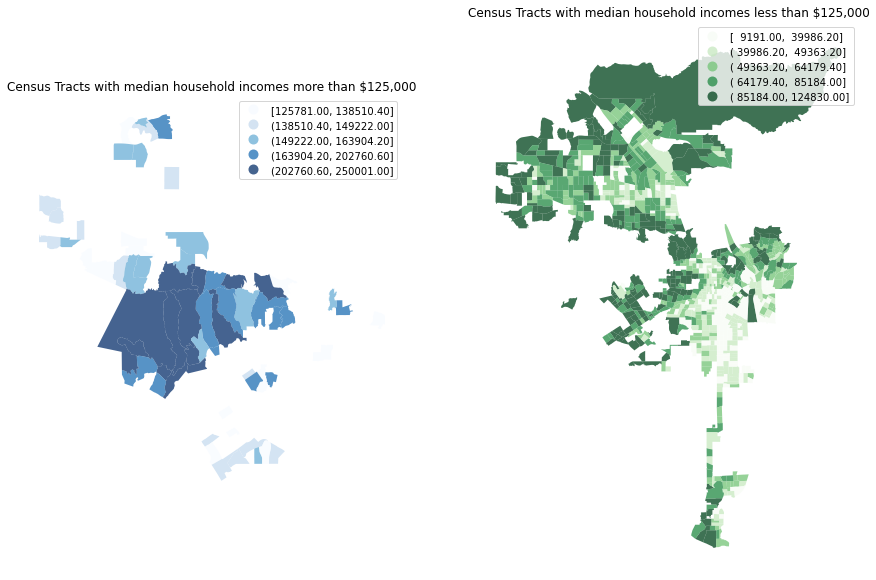

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))

ax1, ax2 = axs

income2[income2.Median_Household_Income > 125000].plot(column='Median_Household_Income',
            cmap='Blues',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Census Tracts with median household incomes more than $125,000")

income2[income2.Median_Household_Income < 125000].plot(column='Median_Household_Income',
            cmap='Greens',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Census Tracts with median household incomes less than $125,000")

TWO MAPS?!?! WOW! One map features the bottom half of median household incomes and one features the upper half of median household incomes in Los Angeles. These maps show that the higher income communities are concentrated in hills and valleys north west of Los Angeles. Conversely, the lower income communities are spread around Los Angeles, with the lowest incomes being in the South LA area.

### Creating the interactive map
Now we can get started on creating our interactive data maps! We will first make an interactive choropleth map that shades the census tracts according to how high or low their median household income is. We are able to hover over each census tract to see the census tract number.

In [13]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='OpenStreetMap', 
               attribution='CartoDB')

choropleth = folium.Choropleth(
                  geo_data=income2, 
                  data=income2,         
                  key_on='feature.properties.Census_Tract',
                  columns=['Census_Tract', 'Median_Household_Income'],
                  fill_color='YlOrRd',
                  line_weight=1, 
                  fill_opacity=0.8,
                  line_opacity=0.5, 
                  legend_name='Median Household Income per Census Tract (ACS 2019 5-Year Estimates)').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Census_Tract'],labels=False)
)
m


How beautiful!! The census tracts with higher incomes have a darker red color. This color scheme is presented in the key in the top right.

Now it's time to import our park data so we can add it as a layer to the map!

In [14]:
parks2 = pd.read_csv('Data3/PR2.csv')
parks2.head()

,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,StName,StSuffix,StSuffixDirection,AddressType,AddressTypeValue,...,CrossStSuffix,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y
0,Parks,La Mirada Park Acquisition Site,5401.0,NaN,W,La Mirada,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90029\n(34.0942, -118.307)",CA,90029,NaN,(310) 548-7675,13,34.094208,-118.306999
1,Parks,Avalon-San Pedro Park,4025.0,NaN,NaN,Avalon,Blvd,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90011\n(34.0104, -118.266)",CA,90011,NaN,(310) 548-7675,9,34.010389,-118.265542
2,Parks,11th Avenue Park,6116.0,NaN,NaN,11th,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90043\n(33.9845, -118.329)",CA,90043,NaN,(310) 548-7675,8,33.984488,-118.329232
3,Parks,Imperial Courts Park,2250.0,NaN,E,114th,St,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90059\n(33.9313, -118.232)",CA,90059,http://www.laparks.org/dos/reccenter/facility/...,(323) 564-1834,15,33.931257,-118.232420
4,Parks,Eagle Rock Hillside Park,NaN,NaN,NaN,N. of Ventura Freeway,NaN,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90041\n(34.149, -118.202)",CA,90041,http://www.laparks.org/dos/parks/facility/eagl...,(213) 485-5054,14,34.149007,-118.202226


Now that we got our income data AND our park data, we can display both on our interactive map! How exciting! Since we have extensive data sets including parks and other public facilities, we will create two maps. One with only parks and the other with both parks and public facilities!

The markers on this map only show parks. You can hover over the markers to see the park names. You can also still hover over the census tracts to see what tract they are.

In [15]:
for index, row in parks2.iterrows():
    tooltip_text = row.Location_Name
    folium.Marker(
        [row.X,row.Y], 
        popup=row.Location_Name,
        tooltip=tooltip_text,
        icon=folium.Icon(color='green')
).add_to(m)

m

Now let's bring in the rest of our public recreational facilities.

In [16]:
parks = pd.read_csv('Data3/PR1.csv')
parks.head()

,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,StName,StSuffix,StSuffixDirection,AddressType,AddressTypeValue,...,CrossStSuffix,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y
0,Parks,La Mirada Park Acquisition Site,5401.0,NaN,W,La Mirada,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90029\n(34.0942, -118.307)",CA,90029,NaN,(310) 548-7675,13,34.094208,-118.306999
1,Gardens,Drew St,3304.0,NaN,N,Drew,St,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90065\n(34.12, -118.243)",CA,90065,NaN,(213) 485-5572,13,34.119958,-118.242682
2,Parks,Avalon-San Pedro Park,4025.0,NaN,NaN,Avalon,Blvd,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90011\n(34.0104, -118.266)",CA,90011,NaN,(310) 548-7675,9,34.010389,-118.265542
3,Parks,11th Avenue Park,6116.0,NaN,NaN,11th,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90043\n(33.9845, -118.329)",CA,90043,NaN,(310) 548-7675,8,33.984488,-118.329232
4,Gardens,El Sereno Community Garden,5450.0,NaN,E,Huntington,Dr,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90032\n(34.0923, -118.162)",CA,90032,NaN,(213) 485-5572,14,34.092346,-118.161574


Let's make a map with all the public recreational facilities.

In [17]:
for index, row in parks.iterrows():
    tooltip_text = row.Location_Name
    folium.Marker(
        [row.X,row.Y], 
        popup=row.Location_Name, 
        tooltip=tooltip_text,
        icon=folium.Icon(color='green')
).add_to(m)

m

## Conclusion
WOW!! From this map we can see that the highest income areas actually have fewer parks than the lower income areas. This is surprising to us because we had hypothesized that the opposite would be true. The highest income areas might have fewer parks because the people there tend to own single family homes with large yards that can substitute a park. Also, those neighborhoods are close to hiking trails. Finally, the residents there are more likely to own a car that they can drive to a park. 

We look forward to deeping our analysis by applying new tools we learn in the upcoming labs.

### Group division of labor
Brian Ramirez helped kickstart the project by acquiring the income census data and creating several insightful charts from the data. Kimberly Venegas found the park data and focused on creating the maps. Both of them worked together to improve what they each created and they helped each other solve issues that came up.